In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import linalg as LA

## Panaroma stitching
Stitching of images done by finding the sift feature mapping between the images, after which we find the homomgraphy matrix using the matches between the images. The hography matrix is calculated by using ransac to refine the parameters of direct linear transform

In [8]:
def sift_feat(img):
    # Function to generate sift feature in int32 list format
    descriptor = cv2.xfeatures2d.SIFT_create()
    key, feat = descriptor.detectAndCompute(img, None)

    keyp = np.int32([kp.pt for kp in key])
    return key, feat    

In [29]:
img = "images/image_mosaicing/img1_1.jpg"
# sift_feat(cv2.imread(img))
key, feat = sift_feat(cv2.imread(img))
# print (key.shape)
print (feat.shape)

(67847, 128)


In [9]:
def sift_match(img1, img2):
    #function to find the matches between two featres of two images using brute force matcher
    key1, feat1 = sift_feat(img1)
    key2, feat2 = sift_feat(img2)
    bf = cv2.BFMatcher()
    matches = bf.match(feat1,feat2)
    matches = sorted(matches, key = lambda x:x.distance)[:100]
    pts1 = np.float32([ key1[m.queryIdx].pt for m in matches ]).reshape(-1,2)
    pts2 = np.float32([ key2[m.trainIdx].pt for m in matches ]).reshape(-1,2)
    #draw before sorting bw 5 and 6
    return pts1, pts2

In [78]:
img1 = cv2.imread("images/image_mosaicing/img1_1.jpg")
img2 = cv2.imread("images/image_mosaicing/img1_2.jpg")
matches1, matches2 = sift_match(img1, img2)

In [79]:
print (matches1)
print (matches2)

[[2659.8838  1189.5062 ]
 [3033.5042  1261.4258 ]
 [3310.6455   863.5876 ]
 [3310.6455   863.5876 ]
 [2892.5508  1101.8663 ]
 [2624.7493  1215.671  ]
 [3337.5383  1227.7421 ]
 [3337.5247   814.639  ]
 [2492.9631  1029.8452 ]
 [3826.5935  1010.7528 ]
 [2904.3555   403.96118]
 [3826.5935  1010.7528 ]
 [2859.8157   785.11145]
 [4216.078   1477.9963 ]
 [2988.6387  1229.6458 ]
 [2653.0476  1028.9589 ]
 [3328.5007   569.8619 ]
 [3028.9114   752.99335]
 [3684.6455   318.37814]
 [3035.4324  1815.4066 ]
 [2949.9688   321.27863]
 [3325.119   1205.2017 ]
 [3693.2883  1265.8103 ]
 [3081.4658  1233.4083 ]
 [4253.8354  1286.1964 ]
 [2159.7244  1007.44006]
 [3772.8503   569.48865]
 [2910.4504   741.5566 ]
 [3841.253    845.30927]
 [3449.9683   553.8165 ]
 [3839.5088   584.0212 ]
 [2627.2788   726.09515]
 [3327.8386  1238.3455 ]
 [3795.8682  1041.6016 ]
 [3449.6982   486.94263]
 [2725.0017   726.763  ]
 [3676.3118  1285.5044 ]
 [3850.0432  1059.445  ]
 [3257.1816  1239.0492 ]
 [2489.359   1031.779  ]


In [11]:
def find_H(world_point, image_point):
    trans = []
    for i in range(world_point.shape[0]):
        x = world_point[i,0]
        y = world_point[i,1]
        u = image_point[i,0]
        v = image_point[i,1]
        #print (trans)
        #frame the DLT equations as matrix transforms
        trans.append([x, y, 1, 0, 0, 0, -u*x, -u*y, -u])
        trans.append([0, 0, 0, x, y, 1, -v*x, -v*y, -v])
    trans = np.array(trans)
    #do SVD to solve least squares minimization problem
    U,D,V = LA.svd(trans)
    #last column gives params
    L = V[-1:]
    #reshape the column vector to a 3*4 homography
    H = L.reshape(3,3)
    H = H/H[2,2]
    #print (H.shape)
#     print ("Projection matrix:")
#     print (H)
    return H

In [12]:
def error(P,world,image):
#     P = np.dot(K,np.hstack((R[:,0:2],t)))
    err = 0
    count = 0
#     image = np.insert(image, 2, 1, axis=1)
    for (x, y) in world:
        point = np.array([x, y, 1])
        proj = np.dot(P,point)
#         print (proj.reshape(1,3))
        proj = proj[0:2] / proj[2]
        error = LA.norm(proj - image[count], ord = 2)
        err +=error
        count +=1
    return err/world.shape[0]

In [13]:
def ransac(world, image, num_iter = 750):
#     num_iter = 300
    H_init = []
    minimum = 9999999
    for i in range(num_iter):
        ind = np.random.choice(world.shape[0],30,replace = False)
#         ind = np.random.permutation(world.shape[0])
        H = find_H(world[ind],image[ind])
        err = error(H, world[ind], image[ind])
        if err < minimum:
            minimum = err
            H_init = H
#             print (err)
#     print ("Projection for minimum error:",H_init)
    return H_init, minimum

In [80]:
H, err = ransac(matches1, matches2)

In [81]:
dst = cv2.warpPerspective(img2,LA.inv(H),(img1.shape[1]+img2.shape[1],img1.shape[0]))
dst[0:img1.shape[0],0:img1.shape[1],:] = img1

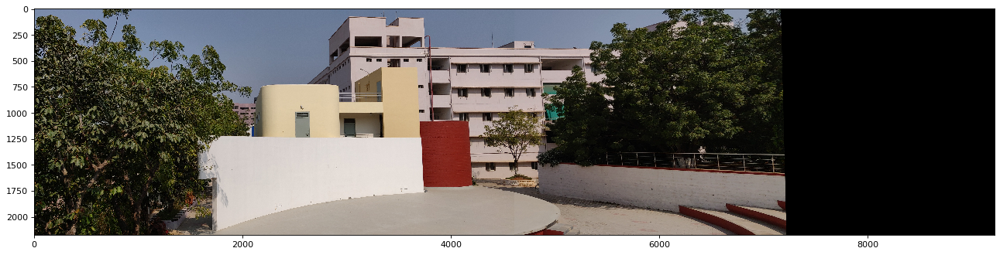

In [82]:
fig = plt.figure(figsize=(20,20),dpi=80)
dst = cv2.cvtColor(dst,cv2.COLOR_BGR2RGB)

plt.imshow(dst)

In [27]:
def stitch(im1, im2):
    
    matches1, matches2 = sift_match(im1, im2)
    H, err = ransac(matches1, matches2)
    out = cv2.warpPerspective(im2,np.linalg.inv(H),(im1.shape[1]+im2.shape[1],im1.shape[0]))
    out[0:im1.shape[0],0:im1.shape[1],:] = im1
    r = np.where(np.sum(out,(0,2)) == 0)[0]
    if(np.size(r)!=0):
        out = out[:,0:r[0],:]
    return out

In [22]:
def stitch2(im1, im2):
    sift = cv2.xfeatures2d.SIFT_create()
    key1, des1 = sift.detectAndCompute(im1,None)
    key2, des2 = sift.detectAndCompute(im2,None)
    bf = cv2.BFMatcher()
    matches = bf.match(des1,des2)
    numMatches = 100
    matches = sorted(matches, key = lambda x:x.distance)[:numMatches]
    pts1 = np.float32([ key1[m.queryIdx].pt for m in matches ]).reshape(-1,2)
    pts2 = np.float32([ key2[m.trainIdx].pt for m in matches ]).reshape(-1,2)
    H, err = ransac(pts1, pts2)
    h1, w1 = im2.shape[:2]
    h2, w2 = im1.shape[:2]
    c1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    c2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    c2_ = cv2.perspectiveTransform(c2, H)
    c = np.concatenate((c1, c2_), axis=0)

    [xmin, ymin] = np.int32(c.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(c.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]

    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])

    out = cv2.warpPerspective(im1, Ht.dot(H), (xmax-xmin, ymax-ymin))
    out[t[1]:h1+t[1], t[0]:w1+t[0]] = im2
    return out
    

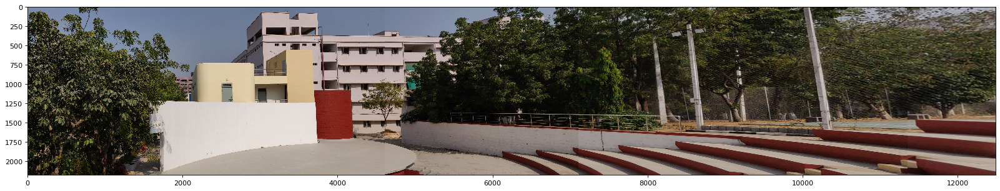

In [192]:
im1 = cv2.imread("images/image_mosaicing/img1_1.jpg")
im2 = cv2.imread("images/image_mosaicing/img1_2.jpg")
im3 = cv2.imread("images/image_mosaicing/img1_3.jpg")
im4 = cv2.imread("images/image_mosaicing/img1_4.jpg")
img_pana = stitch(im1,stitch(im2,stitch(im3,im4)))
img_pana = cv2.cvtColor(img_pana,cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(25,25),dpi=80)
plt.imshow(img_pana)

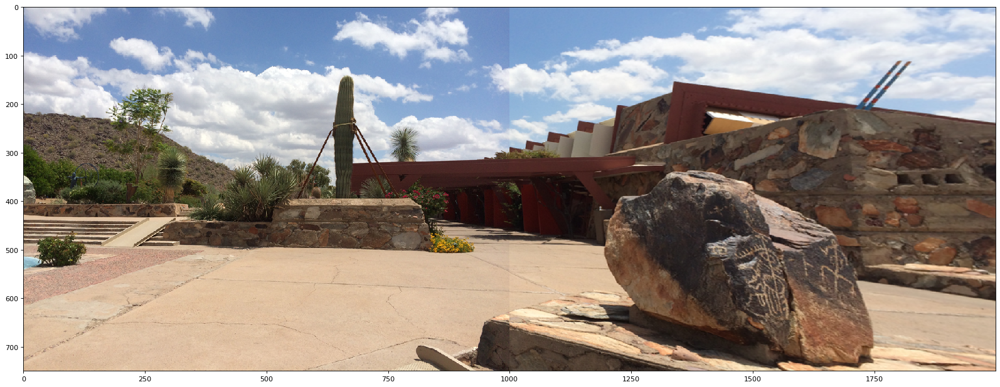

In [193]:
im1 = cv2.imread("images/image_mosaicing/img3_1.png")
im2 = cv2.imread("images/image_mosaicing/img3_2.png")
img_pana = stitch(im1,im2)
img_pana = cv2.cvtColor(img_pana,cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(25,25),dpi=80)
plt.imshow(img_pana)


In [6]:
im1 = cv2.imread("images/image_mosaicing/img2_1.png")
im2 = cv2.imread("images/image_mosaicing/img2_2.png")
im3 = cv2.imread("images/image_mosaicing/img2_3.png")
im4 = cv2.imread("images/image_mosaicing/img2_4.png")
im5 = cv2.imread("images/image_mosaicing/img2_5.png")
im6 = cv2.imread("images/image_mosaicing/img2_6.png")

In [23]:
finalIm2 = stitch2(stitch2(stitch2(im4,stitch2(stitch2(im1,im2),im3)),im5),im6)

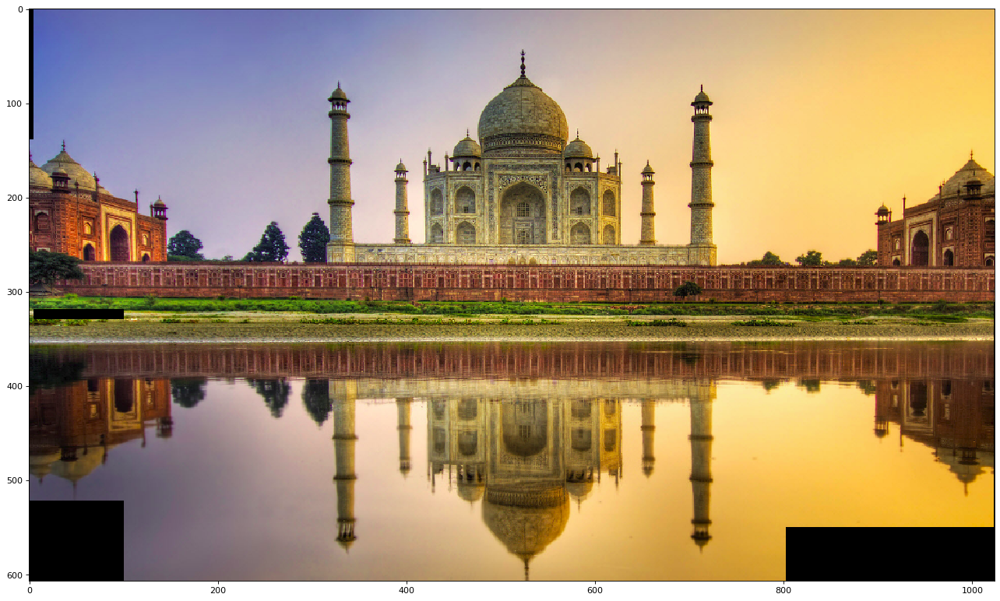

In [24]:
fig = plt.figure(figsize=(20,20),dpi=80)
finalIm2 = cv2.cvtColor(finalIm2,cv2.COLOR_BGR2RGB)
plt.imshow(finalIm2)

In [30]:
im1 = cv2.imread("images/image_mosaicing/img4_1.jpg")
im2 = cv2.imread("images/image_mosaicing/img4_2.jpg")

In [31]:
finalIm4 = stitch(im1,im2)

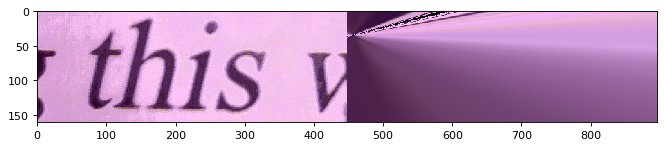

In [32]:
fig = plt.figure(figsize=(10,10),dpi=80)
finalIm4 = cv2.cvtColor(finalIm4,cv2.COLOR_BGR2RGB)
plt.imshow(finalIm4)

# Stereo


## Intensity based matching
We use a sliding window method to get matches between parts of the image(based on the window size)in both the stereo images, which is using the intensities. Here, we take a window template of 128*128.  We find the best match based on the correlation beween the windows

In [8]:
def correlation(v1, v2):
    # Function to find correlation between two images
    img1_s = np.sum((img1-img1.mean())**2)
    img2_s = np.sum((img2-img2.mean())**2)
#     return np.sum((img1-img1.mean())*(img2-img2.mean()))/np.sqrt(img1_s*img2_s)
#     print (v1.T.dot(v2)/(np.sqrt(v1.T.dot(v1))*np.sqrt(v2.T.dot(v2)))).shape
    return v1.T.dot(v2)/(np.sqrt(v1.T.dot(v1))*np.sqrt(v2.T.dot(v2)))
    

In [9]:
def brute_match(key1, key2, img1, img2, wsize):
    
    mat = np.zeros((len(key1), len(key2)), dtype=np.float)
    for i, a in enumerate(key1): 
#         print(a)
        for j, b in enumerate(key2):
            win1 = img1[a[1]-(wsize//2):a[1]+(wsize//2-1), a[0]-(wsize//2):a[0]+(wsize//2-1)]
            win2 = img2[b[1]-(wsize//2):b[1]+(wsize//2-1), b[0]-(wsize//2):b[0]+(wsize//2)]
            mat[i,j] = correlation(win1, win2)
    for i in range(len(key1)):
        mat2 = [key2[np.argmax(mat[i])]]
    return key1, mat2    

In [10]:
def find_point(wsize, w, h, inc):
    point = []
    for i in range(wsize, w - wsize, inc):
        for j in range(wsize, h - wsize, inc):
            point.append((j,i))
    return point
            

In [11]:
def match(img1, img2, match1, match2, wsize, inc):
    w1 = img1.shape[0]
    h1 = img1.shape[1]
    w2 = img2.shape[0]
    h2 = img2.shape[1]
    # for image 1
    point1 = find_point(wsize,w1,h1,inc)
    point2 = find_point(wsize,w2,h2,inc)
    pt1, pt2 = greedy_match(point1, point2, match1, match2, wsize)
    return pt1, pt2
def correlation_matching(img1,img2,window_size=128,stride=128,thresh = 0.01):
    h1,w1,c = img1.shape
    h2,w2,c = img2.shape
    
#     Pass through all the patches in img1 and find patch in img2 with least 
    best_matches = []
#     least_coord = None
    for y1 in range(0,h1-window_size,stride):
        for x1 in range(0,w1-window_size,stride):
            least_dis = 4.0
            for y2 in range(0,h2-window_size,stride):
                for x2 in range(0,w2-window_size,stride):
                    v1 = img1[y1:y1+window_size, x1:x1+window_size,:].flatten()
                    v2 = img2[y2:y2+window_size, x2:x2+window_size,:].flatten()
                    dis = correlation(v1,v2)
                    if least_dis > dis:
                        least_dis = dis
                        least_coord = [x1,y1,x2,y2,dis]
            best_matches.append(least_coord)
    return best_matches
 

In [42]:
def plot(img, matches, window_size = 128):
    h,w = img.shape[0:2]
    for match in matches:
        pt1 = (match[1]+window_size//2,match[0]+window_size//2)
        pt2 = (match[3]+window_size//2+w//2,match[2]+ window_size//2)
        line_img = cv2.line(img,pt1,pt2,(0,0,225),3)
    
#     display_images([[line_img]],shape=(1,1))
    return line_img

In [13]:
def sift_feat1(img):
    descriptor = cv2.xfeatures2d.SIFT_create()
    key, feat = descriptor.detectAndCompute(img, None)

    keyp = np.int32([kp.pt for kp in key])
    return keyp, feat 

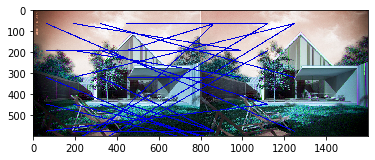

In [253]:
img = cv2.imread("images/stereo_images/1.jpg")
h,w = img.shape[0:2]
img1 = img[:,0:w//2,:]
img2 = img[:,w//2:w,:]
# key1, match1 = sift_feat(img1)
# key2, match2 = sift_feat(img2)
matches= correlation_matching(img1, img2)
display = plot(img,matches)
plt.imshow(display)
plt.show()


## Stereo Rectification
Here, we use the matches of SIFT features, and find the Fundamental matrix using cv2.findFundamentalMat. WE then rectify the images using cv2.stereoRectifyUncalibrated

In [16]:
def rectification(img1, img2):
    key1, feat1 = sift_feat(img1)
    key2, feat2 = sift_feat(img2)
    bf = cv2.BFMatcher()
    matches = bf.match(feat1,feat2)
    matches = sorted(matches, key = lambda x:x.distance)[:100]
    pts1 = np.float32([ key1[m.queryIdx].pt for m in matches ]).reshape(-1,2)
    pts2 = np.float32([ key2[m.trainIdx].pt for m in matches ]).reshape(-1,2)
    #draw before sorting bw 5 and 6
    F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.RANSAC)
    img_size = img1.shape[0:2]
    p, h1, h2 = cv2.stereoRectifyUncalibrated(pts1, pts2, F, img_size)
#     h3 = h2.dot(h1)
    img1_c = cv2.warpPerspective(img1, h1, img_size)
    img2_c = cv2.warpPerspective(img2, h2, img_size)
    
    return img1_c, img2_c

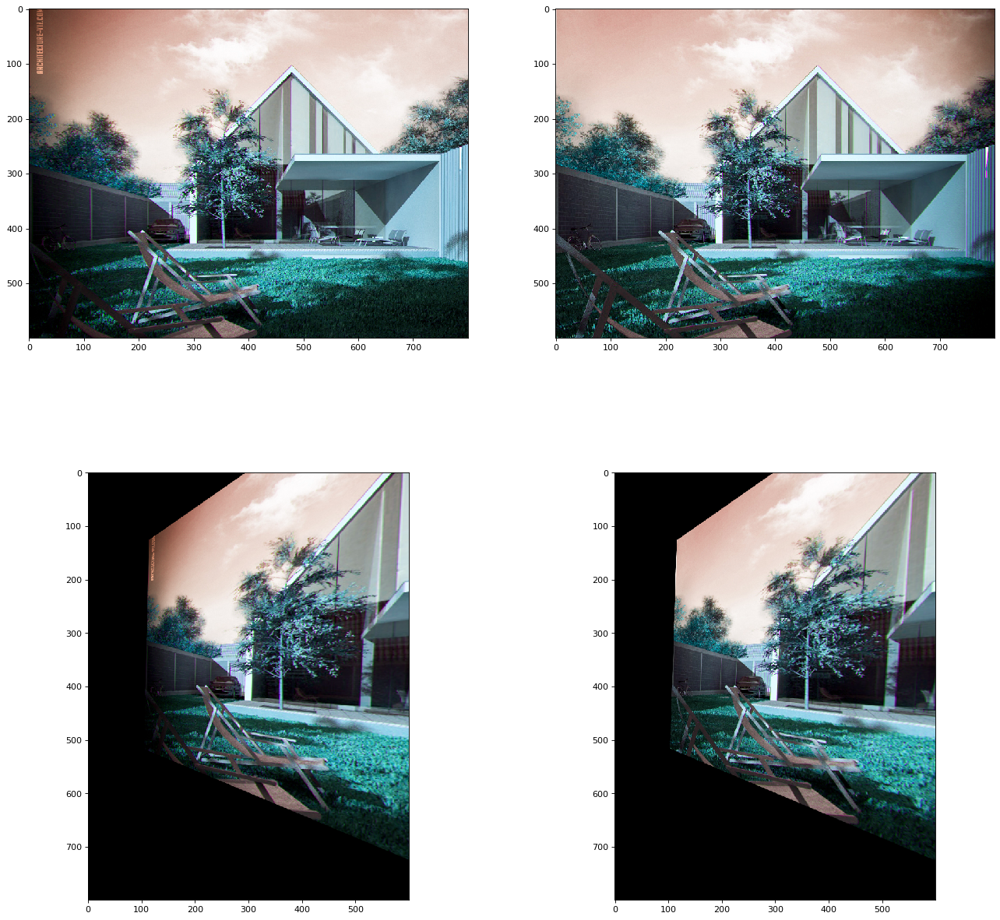

In [273]:
img = cv2.imread('images/stereo_images/1.jpg')
h,w,c = img.shape
img1 = img[:,0:w//2,:]
img2 = img[:,w//2:w,:]
fig = plt.figure(figsize=(20,20),dpi=80)
plt.subplot(221)
plt.imshow(img1)
plt.subplot(222)
plt.imshow(img2)
rect_img1, rect_img2 = rectification(img1,img2)
plt.subplot(223)
plt.imshow(rect_img1)
plt.subplot(224)
plt.imshow(rect_img2)

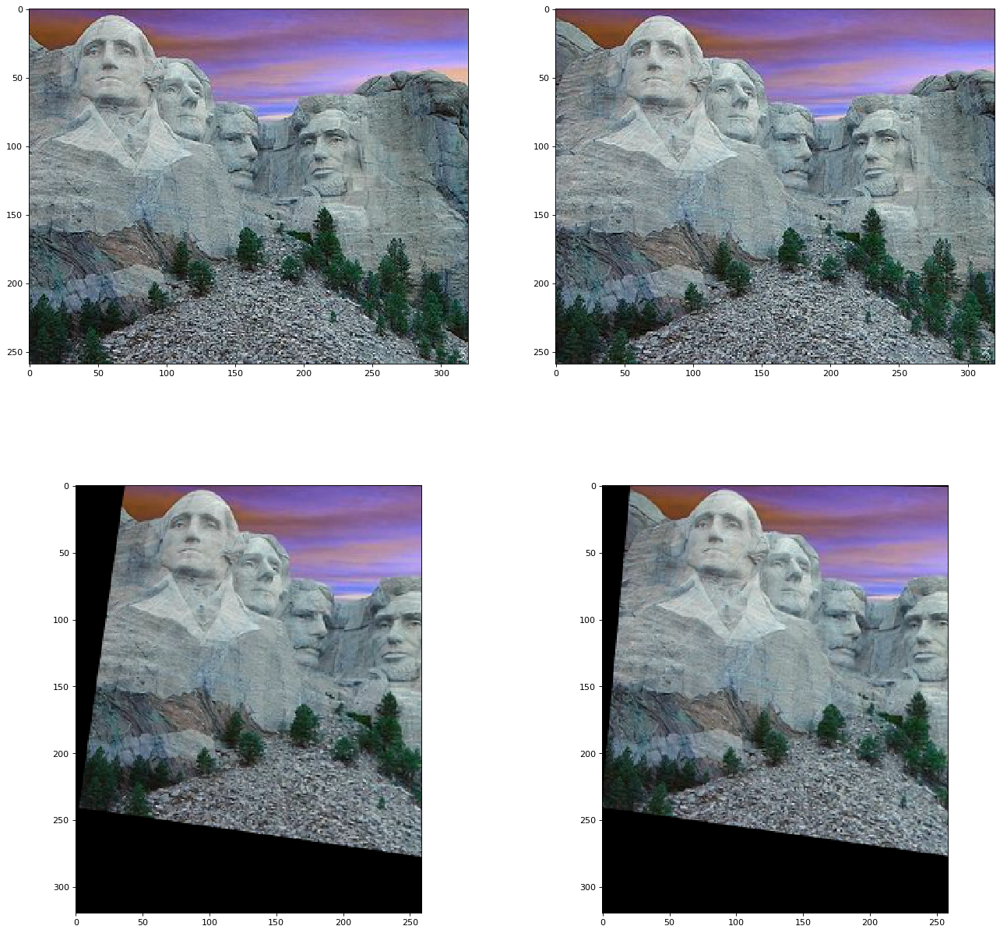

In [210]:
img = cv2.imread('images/stereo_images/2.jpg')
h,w,c = img.shape
img1 = img[:,0:w//2,:]
img2 = img[:,w//2:w,:]
fig = plt.figure(figsize=(20,20),dpi=80)
plt.subplot(221)
plt.imshow(img1)
plt.subplot(222)
plt.imshow(img2)
rect_img1, rect_img2 = rectification(img1,img2)
plt.subplot(223)
plt.imshow(rect_img1)
plt.subplot(224)
plt.imshow(rect_img2)

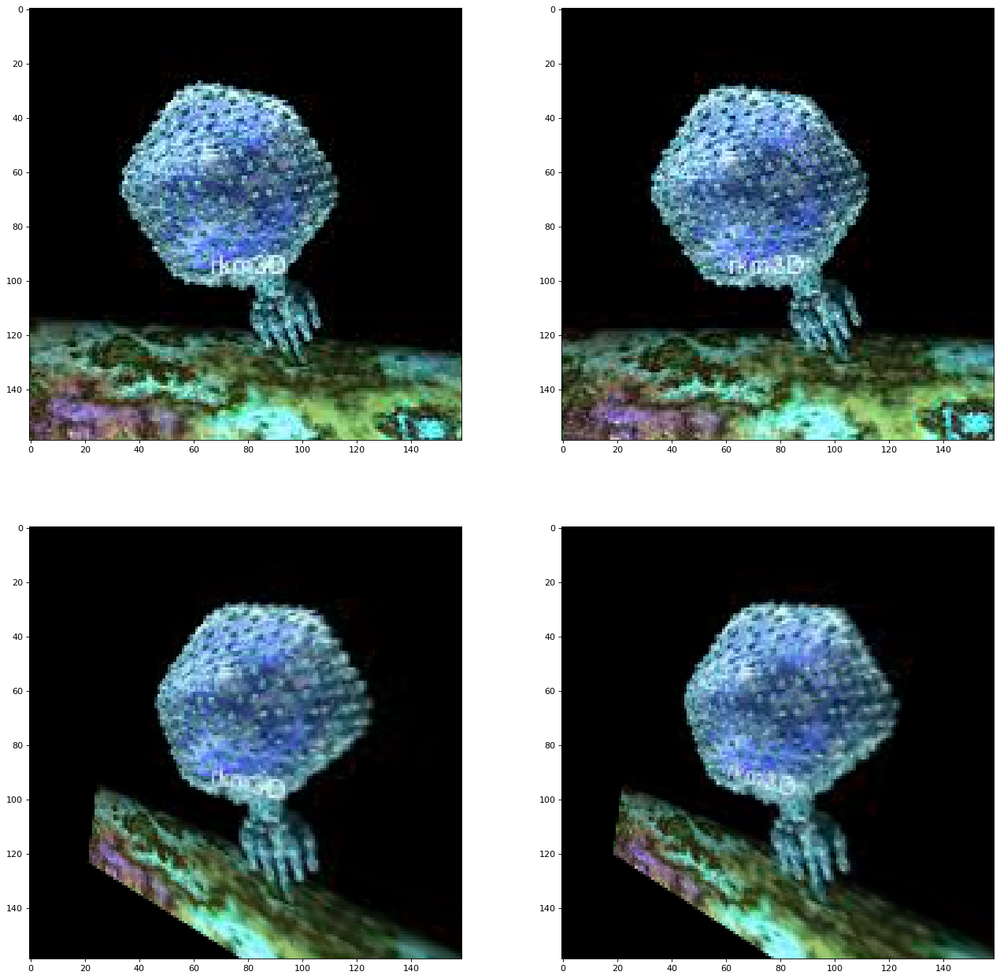

In [211]:
img = cv2.imread('images/stereo_images/3.jpeg')
h,w,c = img.shape
img1 = img[:,0:w//2,:]
img2 = img[:,w//2:w,:]
fig = plt.figure(figsize=(20,20),dpi=80)
plt.subplot(221)
plt.imshow(img1)
plt.subplot(222)
plt.imshow(img2)
rect_img1, rect_img2 = rectification(img1,img2)
plt.subplot(223)
plt.imshow(rect_img1)
plt.subplot(224)
plt.imshow(rect_img2)

## We now plot the matches between the rectified images using the window based intensity method
 
We run matching algorithm and plot the matches between the stereo calibrated outputs

/home/ajay/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


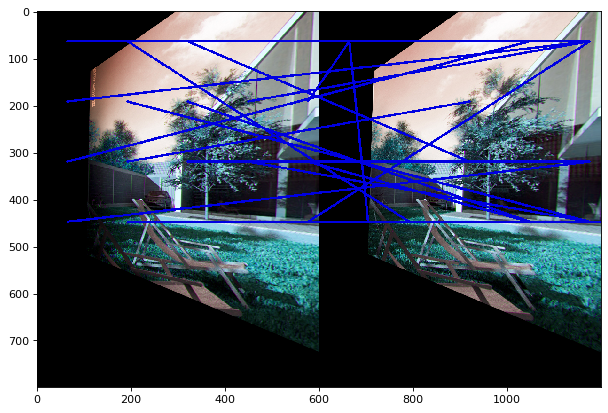

In [28]:
img = cv2.imread('images/stereo_images/1.jpg')
h,w,c = img.shape
img1 = img[:,0:w//2,:]
img2 = img[:,w//2:w,:]
fig = plt.figure(figsize=(20,20),dpi=80)
rect_img1, rect_img2 = rectification(img1,img2)
matches= correlation_matching(rect_img1, rect_img2)
full_img = np.concatenate((rect_img1,rect_img2), axis=1)
display = plot(full_img,matches)
plt.subplot(223)
plt.imshow(display)

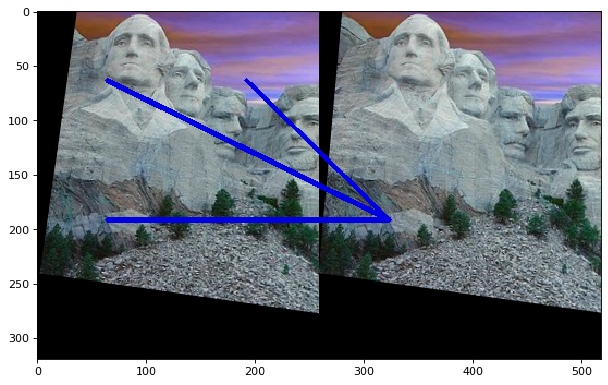

In [27]:
img = cv2.imread('images/stereo_images/2.jpg')
h,w,c = img.shape
img1 = img[:,0:w//2,:]
img2 = img[:,w//2:w,:]
fig = plt.figure(figsize=(20,20),dpi=80)
rect_img1, rect_img2 = rectification(img1,img2)
matches= correlation_matching(rect_img1, rect_img2)
full_img = np.concatenate((rect_img1,rect_img2), axis=1)
display = plot(full_img,matches)
plt.subplot(223)
plt.imshow(display)

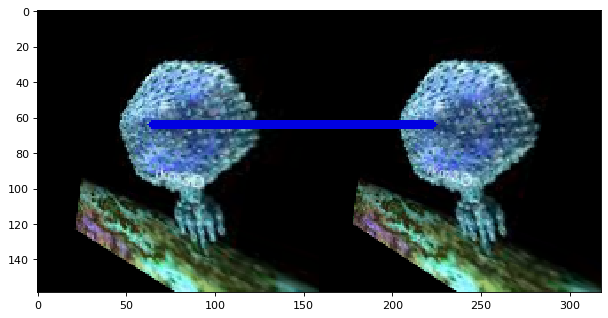

In [29]:
img = cv2.imread('images/stereo_images/3.jpeg')
h,w,c = img.shape
img1 = img[:,0:w//2,:]
img2 = img[:,w//2:w,:]
fig = plt.figure(figsize=(20,20),dpi=80)
rect_img1, rect_img2 = rectification(img1,img2)
matches= correlation_matching(rect_img1, rect_img2)
full_img = np.concatenate((rect_img1,rect_img2), axis=1)
display = plot(full_img,matches)
plt.subplot(223)
plt.imshow(display)

## Dense SIFT
We use SIFT on all different window size unlike normal SIFT, which matches only based on the descriptors of the feature matches. It is more costly but better than the the traditional method.

In [30]:
def dense_sift(img1,img2):
    sift = cv2.xfeatures2d.SIFT_create()


    h,w,c = img1.shape[0]
    kp=[]
    for i in range(1,h,10):
        for j in range(1,w,10):
            kp.append(cv2.KeyPoint(i, j, 3))
    gray_im1 = cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    kp1,des1 = sift.compute(gray_im1,kp)
    gray_im2 = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    kp2,des2 = sift.compute(gray_im2,kp)
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    matches = bf.match(des1,des2)
    matches = sorted(matches, key = lambda x:x.distance)[0:min_match_cnt]
    draw_params = dict(matchesMask=None,
                       singlePointColor=None,
                       flags=2)
        
    dis_im = cv2.drawMatches(img1,kp1,img1,kp1,matches,None,**draw_params)
  
    
    return kp1,des1,kp2,des2,matches,dis_im

## Greedy Match

In [36]:
def greedy_matching(im1, im2, window_size,stride):
    corresp = {}
    for i in range(0,im1.shape[0]-window_size, stride):
        if i==0:
            patch = im1[i:i+window_size,0:0+window_size]
            cr = -1
            mt = None
            for j in range(0, im1.shape[1]-window_size, stride):
                patch1 = patch.flatten()
                patch2 = im2[i:i+window_size,j:j+window_size].flatten()
                p1 = np.sqrt(np.dot(patch1.T, patch1))*np.sqrt(np.dot(patch2.T,patch2))
                cor= np.dot(patch1.T, patch2)
                if cor>cr:
                    cr = cor
                    mt = j
            corresp[(i,0)] = mt
            prev= mt
        else:
            cr = -1
            for j in range(prev, im1.shape[1]-window_size,stride):
#                 cor = get_correl(patch,im2[i:i+window_size,j:j+window_size])
                if cor>cr:
                    cr = cor
                    mt = j
            corresp[(i,j)] = mt
            prev = mt
    return corresp

In [39]:
pair1=cv2.imread('images/stereo_images/1.jpg')
pair1 = cv2.cvtColor(pair1,cv2.COLOR_BGR2RGB)
imgs1=pair1[:,0:pair1.shape[1]//2,:]
imgs2=pair1[:,(pair1.shape[1]//2+1):,:]
greedy_match = []
greedy_match.append(greedy_matching(imgs1,imgs2,64,64))
print("Points for greedy match:",greedy_match,sep='\n')

Points for greedy match:
[{(0, 0): 256, (64, 704): 256, (128, 704): 256, (192, 704): 256, (256, 704): 256, (320, 704): 256, (384, 704): 256, (448, 704): 256, (512, 704): 256}]


KeyError: 1

<Figure size 1600x1600 with 0 Axes>